In [2]:
# Dependencies
import cv2
import numpy as np
import pandas as pd

import os
import png
import glob
import pickle
import random
from tqdm import tqdm

import pydicom
from pydicom.data import get_testdata_files

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [127]:
# Utils

def sort_DcmFiles(dcm_paths):
    
    sorted_dcm_paths = ['' for i in range(len(dcm_paths))]
    
    try:
        for n, path in enumerate(dcm_paths):
            dataset = pydicom.dcmread(path)
            sorted_dcm_paths[int(dataset.InstanceNumber) - 1] = path

        return sorted_dcm_paths

    except:
        return dcm_paths

def image_3D(sorted_paths, rows, cols):
    
    #image_array = np.zeros((len(sorted_paths), rows, cols))

    image_list = []

    for n, path in enumerate(sorted_paths):
        print(path)
        dataset = pydicom.dcmread(path)                  # Read dcm file
        image = dataset.pixel_array                      # Get image from dcm file
#         if image is None:
#             print(path, n)
#             continue
        image_list.append(cv2.resize(image, (224, 224)))  # pre-process the image
           
    return np.array(image_list)


def get_PatientInfo(dcm_FilePath, num_paths, exam, df):
    
    dataset = pydicom.dcmread(dcm_FilePath)
    print("Instance number / Total instance .. {}/{}".format(str(dataset.InstanceNumber), num_paths))
    print("EDSS score ... {}".format(df[df['Sequence_id'] == int(random_exam)]['EDSS'].values[0]))
    print("Patient id.......:", dataset.PatientID)
    print("Patient Sex.......:", dataset.PatientSex)
    print("Patient Weight.......:", dataset.PatientWeight)
    print("Acquisition Date.......:", dataset.AcquisitionDate)
    print("Pregnancy Status.......:", dataset.PregnancyStatus)
    print("Patient BirthDate.......:", dataset.PatientBirthDate)
    print("Image shape.......:", dataset.pixel_array.shape)
    print("Modality.........:", dataset.Modality)
    print("Study Date.......:", dataset.StudyDate)
    print("")
    plt.imshow(dataset.pixel_array, cmap='gray')
    plt.show()
    
    return dataset.pixel_array.shape
    
def plot_3DImage(image_array, cols=5):
    
    rows = image_array.shape[0] // cols + 1
    fig = plt.figure(figsize=(30, 5*rows))
    
    for n, image in enumerate(image_array):
        print(n)
        ax = fig.add_subplot(rows, cols, n+1)
        ax.imshow(image, cmap='gray')
        plt.subplots_adjust(wspace=0.35, hspace=0.35)
        plt.title("slice_" + str(n))
        
def read_xls(file_path):
    
    return pd.read_excel(file_path, sheet_name='Feuil1')
     

In [5]:
base_path = '/home/alex/Dataset 1/'
exams = [i.split('/')[-1] for i in glob.glob(base_path + '*')]
random_exam = '94184'#random.choice(exams)
dcm_paths = glob.glob(base_path + random_exam + '/*.dcm')
sorted_paths = sort_DcmFiles(dcm_paths)

file_path = '/home/alex/Dataset 1/Dataset - 1.xlsx'
df = read_xls(file_path)

Instance number / Total instance .. 19/30
EDSS score ... 0.0
Patient id.......: 0960001
Patient Sex.......: F
Patient Weight.......: 75.00
Acquisition Date.......: 20150423
Pregnancy Status.......: 0
Patient BirthDate.......: 19790101
Image shape.......: (580, 512)
Modality.........: MR
Study Date.......: 20150423



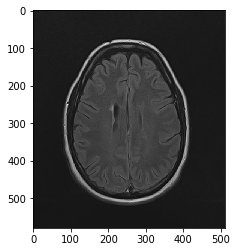

In [6]:
# Get patient information 
rows, cols, = get_PatientInfo(dcm_paths[0], len(dcm_paths), random_exam, df)

In [90]:
#random_exam = random.choice(exams)
#dcm_paths = glob.glob(base_path + random_exam + '/*.dcm')
dataset = pydicom.dcmread('/home/alex/Dataset 1/94184/1.2.392.200036.9116.4.2.7411.10967.8.1001.19.dcm')
image = dataset.pixel_array
#image = cv2.resize(image, (299,299))
#image = np.expand_dims(image, -1)
#image = np.dstack([image, image, image], )

In [89]:
np.min(np.load('trail.npy'))

-636

In [92]:
np.max(image)

9900

In [78]:
np.save('trail',image)

In [68]:
with open('trail.png', "wb") as f:
    writer = png.Writer(width=image.shape[1], height=image.shape[0],
                        greyscale=True, alpha=False, bitdepth=16)
    writer.write(f, image)

error: argument out of range

In [53]:
sum(np.where(image > int(np.max(image)*0.05), 0, 1).flatten())/np.prod(image.shape)

0.0237884521484375

In [10]:
def write_images(patient_folder, image_count, array):
    """
    Write image as 16-bit PNG images
    :param patient_folder: patient folder path
    :param image_count: image number in the serie
    :param array: numpy array of pixels
    """

    img_path = os.path.join(patient_folder, 'image_%02d.png' % image_count)
    with open(img_path, "wb") as f:
        writer = png.Writer(width=array.shape[1], height=array.shape[0],
                            greyscale=True, alpha=False, bitdepth=16)
        writer.write(f, array)

/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.524.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.400.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.438.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.465.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.409.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.552.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.563.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.530.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.493.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.565.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.450.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1

/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.536.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.420.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.459.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.490.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.539.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.543.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.522.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.510.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.396.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.570.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1558058.11291.1380171703.579.dcm
/home/alex/Dataset 1/68281/1.2.840.113619.2.312.6945.1

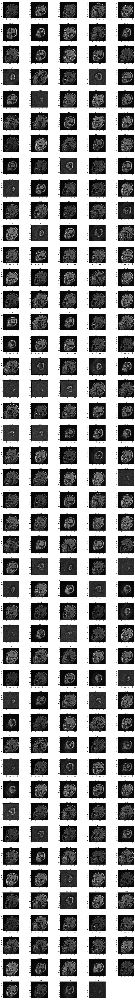

In [43]:
# Plot patient MRI images
#dcm_paths.pop(dcm_paths.index('/home/alex/Dataset 1/26108/1.3.12.2.1107.5.2.18.41433.2015031912480869998469389.dcm'))
image_array = image_3D(dcm_paths, rows, cols)
plot_3DImage(image_array)

# Data Exploration

In [125]:
file_path = '/home/alex/Dataset 1/Dataset - 1.xlsx'

In [128]:
df = read_xls(file_path)
df.head()

,Sequence_id,age,sexe,EDSS,examination_date
0,7428,34,F,1.5,2015-10-23
1,7489,45,M,1.0,2014-05-13
2,7509,48,F,6.0,2014-01-14
3,7525,42,F,2.5,2014-05-19
4,7552,34,M,1.5,2016-02-04


In [100]:
df[df['Sequence_id'] == 7525]['EDSS'].values[0]

2.5

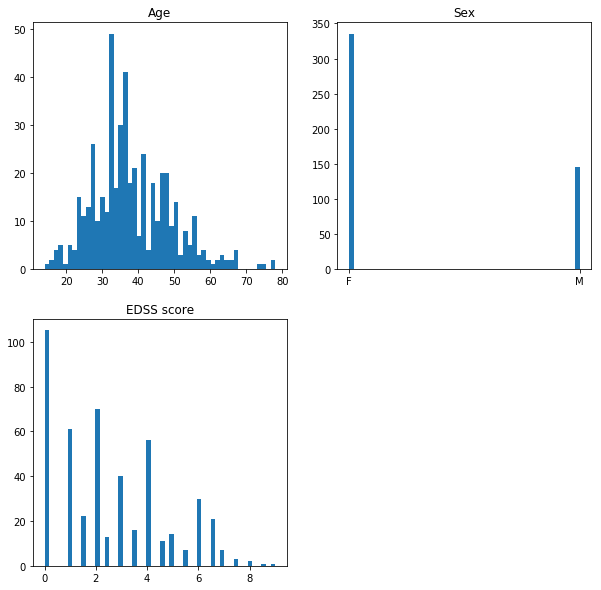

In [73]:
## Stats concerning the xls file 
fig = plt.figure(figsize=(10,10))

rows = 2
cols = 2

ax = fig.add_subplot(rows, cols, 1)
ax.hist(df['age'].tolist(), bins=50)
plt.title("Age")

ax = fig.add_subplot(rows, cols, 2)
ax.hist(df['sexe'].tolist(), bins=50)
plt.title("Sex")

ax = fig.add_subplot(rows, cols, 3)
ax.hist(df['EDSS'].tolist(), bins=50)
plt.title("EDSS score")

plt.show()

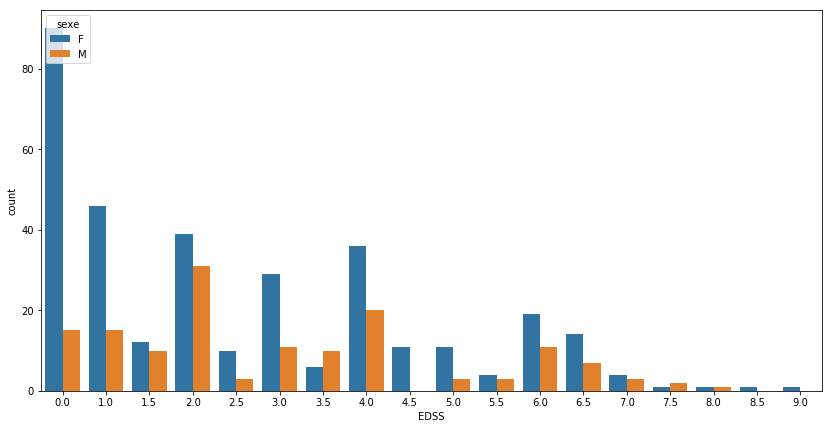

In [64]:
plt.figure(figsize=(14,7))

sns.countplot(x='EDSS',data=df, hue='sexe')

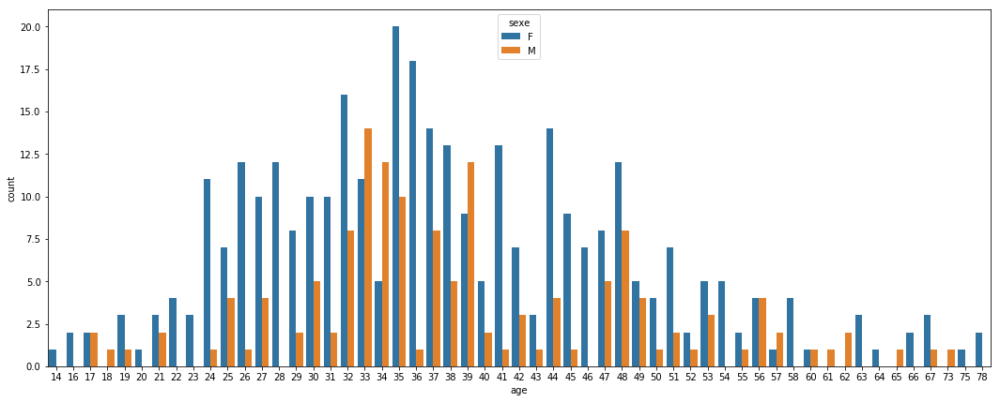

In [66]:
plt.figure(figsize=(18,7))
sns.countplot(x='age',data=df, hue='sexe')

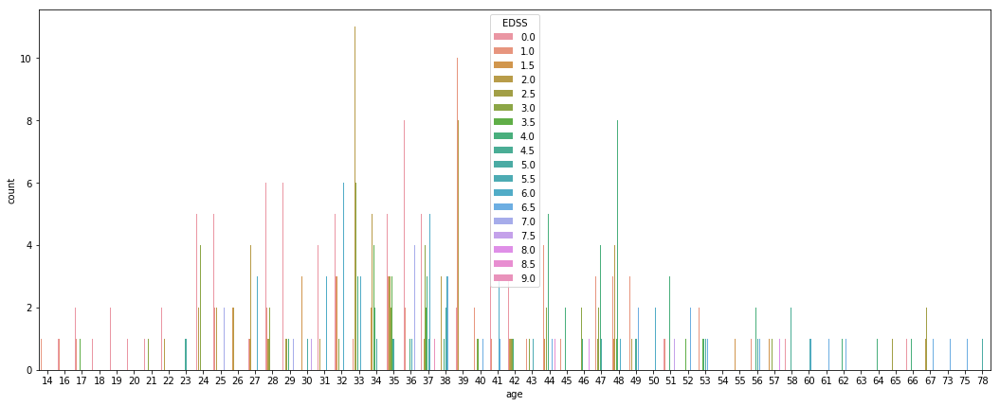

In [67]:
plt.figure(figsize=(18,7))
sns.countplot(x='age',data=df, hue='EDSS')

# Pre-processing

In [7]:
"""
I'm going ahead with some classic pre-processing strategies namely,
- getting path and arranging images in a 3D format
- min-max normalizations
- resahping the image
- keras data augm
"""

"\nI'm going ahead with some classic pre-processing strategies namely,\n- getting path and arranging images in a 3D format\n- min-max normalizations\n- resahping the image\n- keras data augm\n"

In [2]:
class ImagePreprocess(object):
    """
    Class for preparing images
    """
    def __init__(self, resize, channels, norm_type):
        
        self.resize = resize
        self.channels = channels
        self.norm_type = norm_type
     
    def __rescale(self, image):
        """
        Resize and rescale the image
        """
        
        image = cv2.resize(image, (self.resize, self.resize))
        return image.reshape((self.resize, self.resize, self.channels))
        
    def __normalize(self, image):
        """
        Channel-wise normalization
        """
        
        if self.norm_type == 'min-max':
            return np.float32((image - np.min(image))/(0.00001+(np.max(image) - np.min(image))))
        
        elif self.norm_type == 'mean-var':
            return np.float32((image - np.mean(image))/((np.std(image)+0.00001)))
        
        else:
            raise ValueError("Un-identified parameter value, ntype : {}".format(ntype))
    
    def preproc_image(self, image):
        """
        Pre-process the image
        """
        normalized_img = self.__normalize(image)
        rescaled_img = self.__rescale(normalized_img)
            
        return rescaled_img 
        

In [114]:
class GetData(object):
    """
    Class for putting together the training data 
    """
    
    def __init__(self, exam_paths, df_path):
        
        self.exam_paths = exam_paths 
        self.df_path = df_path
        
        #super().__init__(**kwargs)
        
        
    def __get_DCMPaths(self, exam_path):
        """
        Get all examination paths
        """
        return glob.glob(exam_path + '/*')
        
        
    def __get_ExamLabel(self, exam_number):
        """
        Get EDSS exam label
        """
        df = pd.read_excel(self.df_path, sheet_name='Feuil1')
        return df[df['Sequence_id'] == exam_number]['EDSS'].values[0]
        
    
#     def __get_3DImage(self, exam_DCMPaths):
#         """
#         Open dcm files, read image, preprocess them
#         """
#         image_PathList = []
#         target_path = '/home/allwyn/JFRDataChallenge/data/'
#         no_good_paths = ['/home/alex/Dataset 1/26108/1.3.12.2.1107.5.2.18.41433.2015031912480869998469389.dcm']
#         exam_number = exam_DCMPaths[0].split('/')[-2]

#         for n, path in enumerate(exam_DCMPaths):
            
#             if os.path.exists('../data/' + exam_number):
#                 pass
#             else:
#                 os.mkdir('../data/' + exam_number)
#                 print(exam_number)
            
#             if path in no_good_paths:
#                 continue

#             dataset = pydicom.dcmread(path)                  # Read dcm file
#             image = dataset.pixel_array                      # Get image from dcm file
#             save_path = target_path + exam_number +  "/image_" + str(n+1) + ".png"
#             try:                
#                 with open(save_path, "wb") as f:
#                     writer = png.Writer(width=image.shape[1], height=image.shape[0],
#                                         greyscale=True, alpha=False, bitdepth=16)
#                     writer.write(f, image)
#             except:
#                 print(save_path)
                
#             image_PathList.append(save_path)  # pre-process the image
           
#         # Get exam EDSS label
#         label = self.__get_ExamLabel(int(exam_number))
        
#         return image_PathList, label
        
    def __get_3DImage(self, exam_DCMPaths):
        """
        Open dcm files, read image, preprocess them
        """
        image_PathList, image_array_list = [], []
        target_path = '/home/allwyn/JFRDataChallenge/data/'
        no_good_paths = ['/home/alex/Dataset 1/26108/1.3.12.2.1107.5.2.18.41433.2015031912480869998469389.dcm']
        exam_number = exam_DCMPaths[0].split('/')[-2]
        
        
        dataset = pydicom.dcmread(random.choice(exam_DCMPaths))               
        image = dataset.pixel_array   
        image_array = np.zeros((len(exam_DCMPaths), image.shape[0], image.shape[1]))


        for n, path in enumerate(exam_DCMPaths):
            
            if os.path.exists('../data/' + exam_number):
                pass
            else:
                os.mkdir('../data/' + exam_number)
                print(exam_number)
            
            if path in no_good_paths:
                continue

            dataset = pydicom.dcmread(path)                  # Read dcm file
            image = dataset.pixel_array                      # Get image from dcm file            
            image_array[n] = image
            image_PathList.append(save_path)  
            
        # Get exam EDSS label
        save_path = target_path + exam_number +  "/" + exam_number 
        np.save(save_path, image_array)
        
        label = self.__get_ExamLabel(int(exam_number))
        
        return image_PathList, label
    
    
    def save_dataset(self):
        """
        Constructs the dataset
        """
        
        data_MRIImages = []
        data_MRILables = []
        
        for exam_path in tqdm(self.exam_paths):

            exam_DCMPaths = self.__get_DCMPaths(exam_path)
            image_PathList, label = self.__get_3DImage(exam_DCMPaths)

            data_MRIImages.append(image_PathList)
            data_MRILables.append(label)
                                 
        return data_MRIImages, data_MRILables



In [115]:
base_path = '/home/alex/Dataset 1/'
remove = ['Dataset - 1.xlsx']
exam_paths = glob.glob(base_path + '/*')
exam_paths = [i for i in exam_paths if i.split('/')[-1] not in remove]
resize = 299
channels = 1
norm_type = 'min-max'

df_path = base_path + 'Dataset - 1.xlsx'

g = GetData(exam_paths, df_path)

In [116]:
data_MRIImages, data_MRILabels  = g.save_dataset()




  0%|          | 0/480 [00:00<?, ?it/s]


  0%|          | 1/480 [00:02<16:11,  2.03s/it]


  0%|          | 2/480 [00:02<11:49,  1.48s/it]


  1%|          | 3/480 [00:04<13:24,  1.69s/it]


  1%|          | 4/480 [00:04<09:39,  1.22s/it]


  1%|          | 5/480 [00:04<07:08,  1.11it/s]


  1%|▏         | 6/480 [00:06<09:59,  1.27s/it]


  1%|▏         | 7/480 [00:06<07:14,  1.09it/s]


  2%|▏         | 8/480 [00:07<05:28,  1.44it/s]


  2%|▏         | 9/480 [00:07<04:03,  1.93it/s]


  2%|▏         | 10/480 [00:07<03:15,  2.40it/s]


  2%|▏         | 11/480 [00:09<06:37,  1.18it/s]


  2%|▎         | 12/480 [00:11<09:04,  1.16s/it]


  3%|▎         | 13/480 [00:11<07:06,  1.10it/s]


  3%|▎         | 14/480 [00:13<09:48,  1.26s/it]


  3%|▎         | 15/480 [00:13<07:06,  1.09it/s]


  3%|▎         | 16/480 [00:17<13:14,  1.71s/it]


  4%|▎         | 17/480 [00:17<09:31,  1.23s/it]


  4%|▍         | 18/480 [00:17<07:56,  1.03s/it]


  4%|▍         | 19/480 [00:19<09:48,  1.28s/i

ValueError: could not broadcast input array from shape (192,192) into shape (256,224)

In [80]:
glob.glob('/home/alex/Dataset 1/100124/*.dcm')

['/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317230118030895138.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317224634537294870.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317231272898095621.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317223381751294600.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317230313048995455.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317225385412695033.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317225370900395029.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317225370195095028.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.201510231722529235694982.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317225313380194997.dcm',
 '/home/alex/Dataset 1/100124/1.3.12.2.1107.5.2.36.40679.2015102317224843626594904.dcm',
 '/home/alex/Dataset 1

In [ ]:
"""

13658
/home/allwyn/JFRDataChallenge/data/13658/image_1.png
/home/allwyn/JFRDataChallenge/data/13658/image_2.png
/home/allwyn/JFRDataChallenge/data/13658/image_3.png
/home/allwyn/JFRDataChallenge/data/13658/image_4.png
/home/allwyn/JFRDataChallenge/data/13658/image_5.png
/home/allwyn/JFRDataChallenge/data/13658/image_6.png
/home/allwyn/JFRDataChallenge/data/13658/image_7.png
/home/allwyn/JFRDataChallenge/data/13658/image_8.png
/home/allwyn/JFRDataChallenge/data/13658/image_9.png
/home/allwyn/JFRDataChallenge/data/13658/image_10.png
/home/allwyn/JFRDataChallenge/data/13658/image_11.png
/home/allwyn/JFRDataChallenge/data/13658/image_12.png

13656
/home/allwyn/JFRDataChallenge/data/13656/image_1.png
/home/allwyn/JFRDataChallenge/data/13656/image_2.png
/home/allwyn/JFRDataChallenge/data/13656/image_3.png
/home/allwyn/JFRDataChallenge/data/13656/image_4.png
/home/allwyn/JFRDataChallenge/data/13656/image_5.png
/home/allwyn/JFRDataChallenge/data/13656/image_6.png
/home/allwyn/JFRDataChallenge/data/13656/image_7.png
/home/allwyn/JFRDataChallenge/data/13656/image_8.png
/home/allwyn/JFRDataChallenge/data/13656/image_9.png
/home/allwyn/JFRDataChallenge/data/13656/image_10.png
/home/allwyn/JFRDataChallenge/data/13656/image_11.png
/home/allwyn/JFRDataChallenge/data/13656/image_12.png

20015
/home/allwyn/JFRDataChallenge/data/20015/image_1.png
/home/allwyn/JFRDataChallenge/data/20015/image_2.png
/home/allwyn/JFRDataChallenge/data/20015/image_3.png
/home/allwyn/JFRDataChallenge/data/20015/image_4.png
/home/allwyn/JFRDataChallenge/data/20015/image_5.png
/home/allwyn/JFRDataChallenge/data/20015/image_6.png
/home/allwyn/JFRDataChallenge/data/20015/image_7.png
/home/allwyn/JFRDataChallenge/data/20015/image_8.png
/home/allwyn/JFRDataChallenge/data/20015/image_9.png
/home/allwyn/JFRDataChallenge/data/20015/image_10.png
/home/allwyn/JFRDataChallenge/data/20015/image_11.png
/home/allwyn/JFRDataChallenge/data/20015/image_12.png
/home/allwyn/JFRDataChallenge/data/20015/image_13.png
/home/allwyn/JFRDataChallenge/data/20015/image_14.png
/home/allwyn/JFRDataChallenge/data/20015/image_15.png
/home/allwyn/JFRDataChallenge/data/20015/image_16.png
/home/allwyn/JFRDataChallenge/data/20015/image_17.png
/home/allwyn/JFRDataChallenge/data/20015/image_18.png
/home/allwyn/JFRDataChallenge/data/20015/image_19.png
/home/allwyn/JFRDataChallenge/data/20015/image_20.png
/home/allwyn/JFRDataChallenge/data/20015/image_21.png
/home/allwyn/JFRDataChallenge/data/20015/image_22.png

94184
/home/allwyn/JFRDataChallenge/data/94184/image_1.png
/home/allwyn/JFRDataChallenge/data/94184/image_3.png
/home/allwyn/JFRDataChallenge/data/94184/image_4.png
/home/allwyn/JFRDataChallenge/data/94184/image_5.png
/home/allwyn/JFRDataChallenge/data/94184/image_6.png
/home/allwyn/JFRDataChallenge/data/94184/image_7.png
/home/allwyn/JFRDataChallenge/data/94184/image_8.png
/home/allwyn/JFRDataChallenge/data/94184/image_9.png
/home/allwyn/JFRDataChallenge/data/94184/image_10.png
/home/allwyn/JFRDataChallenge/data/94184/image_12.png
/home/allwyn/JFRDataChallenge/data/94184/image_13.png
/home/allwyn/JFRDataChallenge/data/94184/image_14.png
/home/allwyn/JFRDataChallenge/data/94184/image_15.png
/home/allwyn/JFRDataChallenge/data/94184/image_16.png
/home/allwyn/JFRDataChallenge/data/94184/image_17.png
/home/allwyn/JFRDataChallenge/data/94184/image_18.png
/home/allwyn/JFRDataChallenge/data/94184/image_19.png
/home/allwyn/JFRDataChallenge/data/94184/image_20.png
/home/allwyn/JFRDataChallenge/data/94184/image_21.png
/home/allwyn/JFRDataChallenge/data/94184/image_22.png
/home/allwyn/JFRDataChallenge/data/94184/image_23.png
/home/allwyn/JFRDataChallenge/data/94184/image_25.png
/home/allwyn/JFRDataChallenge/data/94184/image_26.png
/home/allwyn/JFRDataChallenge/data/94184/image_27.png
/home/allwyn/JFRDataChallenge/data/94184/image_28.png
/home/allwyn/JFRDataChallenge/data/94184/image_29.png
/home/allwyn/JFRDataChallenge/data/94184/image_30.png
23847
"""

In [27]:
image = cv2.imread('/home/allwyn/JFRDataChallenge/data/25826/image_10.png', 0)

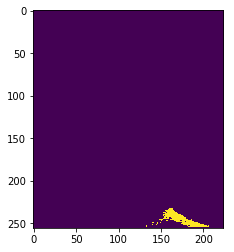

In [28]:
plt.imshow(image)

In [ ]:
# # Save files 
# with open('../data/data_MRIImages.pkl', 'wb') as f:
#     pickle.dump(data_MRIImages, f)
# with open('../data/data_MRILabels.pkl', 'wb') as f:
#     pickle.dump(data_MRILabels, f)


In [3]:
# Open files
with open('../data/data_MRIImages.pkl', 'rb') as f:
    data_MRIImages = pickle.load(f)
    
with open('../data/data_MRILabels.pkl', 'rb') as f:
    data_MRILabels = pickle.load(f)

In [48]:
import imgaug as ia
from imgaug import augmenters as iaa

class ImageBaseAug(object):
    def __init__(self):
        sometimes = lambda aug: iaa.Sometimes(0.5, aug)
        self.seq = iaa.Sequential(
            [
                # Blur each image with varying strength using
                # gaussian blur (sigma between 0 and 3.0),
                # average/uniform blur (kernel size between 2x2 and 7x7)
                # median blur (kernel size between 3x3 and 11x11).
                iaa.OneOf([
                    iaa.GaussianBlur((0, 1.0)),
                    iaa.AverageBlur(k=(2, 5)),
                    iaa.MedianBlur(k=(3, 11)),
                ]),
                # Sharpen each image, overlay the result with the original
                # image using an alpha between 0 (no sharpening) and 1
                # (full sharpening effect).
                sometimes(iaa.Sharpen(alpha=(0, 0.5), lightness=(0.75, 1.5))),
                # Add gaussian noise to some images.
                sometimes(iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5)),
                # Add a value of -5 to 5 to each pixel.
                sometimes(iaa.Add((-5, 5), per_channel=0.5)),
                # Change brightness of images (80-120% of original value).
                sometimes(iaa.Multiply((0.8, 1.2), per_channel=0.5)),
                # Improve or worsen the contrast of images.
                sometimes(iaa.ContrastNormalization((0.5, 2.0), per_channel=0.5)),
            ],
            # do all of the above augmentations in random order
            random_order=True
        )

    def __call__(self, image):
        seq_det = self.seq.to_deterministic()
        print(seq_det)
        #image, label = #sample['image'], sample['label']
        image = seq_det.augment_images([image])[0]
        return image #{'image': image, 'label': label}

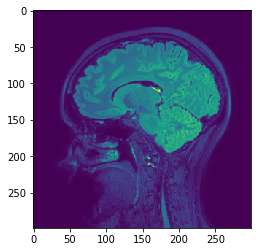

In [83]:
plt.imshow(data_MRIImages[0][0].squeeze())

In [114]:
1 - (np.sum(data_MRIImages[0][0] == 0)/(299*299))

0.6408765002628606

In [112]:
np.sum(data_MRIImages[0][0].squeeze() == 0) / (299*299)

0.3591234997371394

In [82]:
data_MRIImages[0][0].shape

(299, 299, 1)

Sequential(name=UnnamedSequential, random_order=True, children=[SomeOf(name=UnnamedSomeOf, n=1, random_order=False, augmenters=[GaussianBlur(name=UnnamedGaussianBlur, parameters=[Uniform(Deterministic(int 0), Deterministic(float 1.00000000))], deterministic=True)], deterministic=True), Sometimes(p=Binomial(Deterministic(float 0.50000000)), name=UnnamedSometimes, then_list=Sequential(name=UnnamedSometimes-then, random_order=False, children=[Convolve(name=UnnamedSharpen, parameters=[<function Sharpen.<locals>.create_matrices at 0x7f3b9d3621e0>, function], deterministic=True)], deterministic=True), else_list=None, deterministic=True), Sometimes(p=Binomial(Deterministic(float 0.50000000)), name=UnnamedSometimes, then_list=Sequential(name=UnnamedSometimes-then, random_order=False, children=[AddElementwise(name=UnnamedAdditiveGaussianNoise, parameters=[Normal(loc=Deterministic(int 0), scale=Uniform(Deterministic(float 0.00000000), Deterministic(float 12.75000000))), Binomial(Deterministic(fl

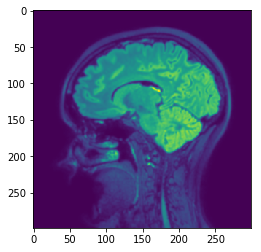

In [53]:
img = au(data_MRIImages[0][0])
plt.imshow(img.squeeze())

In [78]:
a = cv2.fastNlMeansDenoising(data_MRIImages[0][0], None, 1, normType=cv2.NORM_L2)

error: OpenCV(3.4.2) /io/opencv/modules/photo/src/denoising.cpp:120: error: (-215:Assertion failed) hn == 1 || hn == cn in function 'fastNlMeansDenoising'


2

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [6]:
class CNN1(nn.Module):
    
    def __init__(self):
        
        super(CNN1,self).__init__()
        
        self.layer_1 = nn.Sequential(nn.BatchNorm2d(1),
                                     nn.Conv2d(1,32,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(32),
                                     nn.Conv2d(32,32,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_2 = nn.Sequential(nn.BatchNorm2d(32),
                                     nn.Conv2d(32,64,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(64),
                                     nn.Conv2d(64,64,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_3 = nn.Sequential(nn.BatchNorm2d(64),
                                     nn.Conv2d(64,128,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(128),
                                     nn.Conv2d(128,128,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_4 = nn.Sequential(nn.BatchNorm2d(128),
                                     nn.Conv2d(128,256,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(256),
                                     nn.Conv2d(256,256,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_5 = nn.Sequential(nn.BatchNorm2d(256),
                                     nn.Conv2d(256,256,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(256),
                                     nn.Conv2d(256,256,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_6 = nn.Sequential(nn.BatchNorm2d(256),
                                     nn.Conv2d(256,512,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(512),
                                     nn.Conv2d(512,512,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        
    def forward(self, x, batch_size):

        x = self.layer_1(x)
        x = self.layer_2(x)
        x = self.layer_3(x)
        x = self.layer_4(x)
        x = self.layer_5(x)
        out = self.layer_6(x)
        out = out.view(batch_size, -1)
        return out
    
    
class CNN2(nn.Module):
    
    def __init__(self):
        
        super(CNN1,self).__init__()
        
        self.layer_1 = nn.Sequential(nn.BatchNorm2d(1),
                                     nn.Conv2d(1,32,1,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(32),
                                     nn.Conv2d(32,32,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_2 = nn.Sequential(nn.BatchNorm2d(32),
                                     nn.Conv2d(32,64,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(64),
                                     nn.Conv2d(64,64,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_3 = nn.Sequential(nn.BatchNorm2d(64),
                                     nn.Conv2d(64,128,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(128),
                                     nn.Conv2d(128,128,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_4 = nn.Sequential(nn.BatchNorm2d(128),
                                     nn.Conv2d(128,256,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(256),
                                     nn.Conv2d(256,256,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_5 = nn.Sequential(nn.BatchNorm2d(256),
                                     nn.Conv2d(256,256,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(256),
                                     nn.Conv2d(256,256,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        self.layer_6 = nn.Sequential(nn.BatchNorm2d(256),
                                     nn.Conv2d(256,512,3,padding=1),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(512),
                                     nn.Conv2d(512,512,3,padding=1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(2,1))
        
    def forward(self, x, batch_size):

        x = self.layer_1(x)
        x = self.layer_2(x)
        x = self.layer_3(x)
        x = self.layer_4(x)
        x = self.layer_5(x)
        out = self.layer_6(x)
        out = out.view(batch_size, -1)
        return out

In [7]:
for n, image3D in enumerate(data_MRIImages):

    print(image3D.shape, data_MRILabels[n])
    
    for m, image in enumerate(image3D):
        image = np.expand_dims(np.squeeze(image), axis=0)
        print(image.shape)
        if m == 10: break
    if n==10:break

(365, 299, 299, 1) 0.0
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(35, 299, 299, 1) 4.0
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(365, 299, 299, 1) 1.5
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(30, 299, 299, 1) 2.0
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(27, 299, 299, 1) 4.0
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(300, 299, 299, 1) 3.0
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 299)
(1, 299, 29

In [ ]:
ima

In [ ]:
for image3D, labels in (data_MRIImages, data_MRILabels):

    for image3D, labels in tqdm(dataset):

        image = Variable(image).cuda()
        image_noise = torch.add(image, N_FACTOR*noise)
        image_noise = Variable(image_noise).cuda()

        optimizer.zero_grad()
        e_output = encoder(image_noise, BATCH_SIZE)
        d_output = decoder(e_output, BATCH_SIZE)
        loss = loss_func(d_output, image)
        loss.backward()
        optimizer.step()

# References

https://www.kaggle.com/shivamb/3d-convolutions-understanding-use-case


# Issues 

- Exams in dataset have missing dcm files (eg: .dcm file states that exam contians 35 slices, but only 22 were to be found)
- Few dcm files have corrupt images, hence can't be opened
- Some dcm files within an exam have similar instance numbers but different images
- Some exams have images taken from differnet angles (could explain the reason as to why images have 
- No point sorting images, as a good percentage of the exams don't have missing or mixed elements 

# Questions

In [8]:
"""
- What is Slice Thickness
- What is spacing between slices
- What's the deal with Acquisition Contrast and 
- Difference between (3D Flair et axial T2 Flair)
- Est-ce que c'est normal de faire la suivi d'un patient avec
des image ayant des modalités differnet ?
"""

"\n- What is Slice Thickness\n- What is spacing between slices\n- What's the deal with Acquisition Contrast and \n- Difference between (3D Flair et axial T2 Flair)\n- Est-ce que c'est normal de faire la suivi d'un patient avec\ndes image ayant des modalités differnet ?\n"

In [249]:
class ImagePreprocess(object):
    """
    Class for preparing images
    """
    def __init__(self, resize, normalization, channels=1):


        self.channels = channels
        self.image_resize = resize
        self.normalization = normalization

    def __rescale(self, image):
        """
        Resize and rescale the image
        """

        image = cv2.resize(image, (self.image_resize, self.image_resize))
        return image.reshape(( self.channels, self.image_resize, self.image_resize))

    def __normalize(self, image):
        """
        Channel-wise normalization
        """

        if self.normalization == 'min-max':
            return np.float32((image - np.min(image))/(0.00001+(np.max(image) - np.min(image))))

        elif self.normalization == 'mean-var':
            return np.float32((image - np.mean(image))/((np.std(image)+0.00001)))

        else:
            raise ValueError("Un-identified parameter value, ntype : {}".format(ntype))

    def preproc_image(self, image):
        """
        Pre-process the image by applying normalization and 
        resizing
        """
        normalized_img = self.__normalize(image)
        rescaled_img = self.__rescale(normalized_img)

        return rescaled_img 


    def transform_images(self, image, transformation='original', angle=30):
        """
        Method to generate images based on the requested transfomations
        Args:
        - image             (nd.array)  : input image array
        - transformation    (str)       : image transformation to be effectuated
        - angle 		(int)	    : rotation angle if transformation is a rotation
        Returns:
        - trans_image       (nd.array)  : transformed image array
        """
        
        def rotateImage(image, angle):
            """
            Function to rotate an image at its center
            """
            image_center = tuple(np.array(image.shape[1::-1]) / 2)
            rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
            result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
            return result

        # Image transformations
        if transformation == 'original':
            trans_image = image
        elif transformation == 'flip_v':
            trans_image = cv2.flip(image, 0)
        elif transformation == 'flip_h':
            trans_image = cv2.flip(image, 1)
        elif transformation == 'flip_vh':
            trans_image = cv2.flip(image, -1)
        elif transformation == 'rot_c':
            trans_image = rotateImage(image, -angle)
        elif transformation == 'rot_ac':
            trans_image = rotateImage(image, angle)
        else:
            raise ValueError("In valid transformation value passed : {}".format(transformation))

        return trans_image



In [258]:
import glob

import cv2

import pydicom
from pydicom.data import get_testdata_files


class SEP_generator(ImagePreprocess):
    
    def __init__(self, patient_InfoDatabase, base_DatabasePath, **kwargs):
        """
        Args:
        - patient_information	(list) : list of tuples : (patient_id, patient_edss_score) 

        """
        self.resize 									= kwargs['resize']
        self.patient_InfoDatabase						= patient_information
        self.base_DatabasePath                          = base_DatabasePath
        self.nogood_DCMPaths 							= ['/home/alex/Dataset 1/26108/1.3.12.2.1107.5.2.18.41433.2015031912480869998469389.dcm']

        super().__init__(**kwargs)

    def __get_DCMFilePaths(self, patient_information, base_DatabasePath='/home/alex/Dataset 1'):
        """
        Internal method to get path towards patient dcm files
        """
        patient_id, patient_label = patient_information
        patient_path = base_DatabasePath + '/' + str(patient_id) + '/*.dcm'

        patient_dcm_FilePaths = glob.glob(patient_path)

        return patient_dcm_FilePaths, patient_label


    def __extract_DCMImage(self, dcm_path):

        dataset = pydicom.dcmread(dcm_path)       	# Read dcm file
        image = dataset.pixel_array					# Exctact image from dcm files 

        return image


    def generator(self, max_slices=70, dark_matter=0.7):

        """
        Args:
        - max_slices	(int) 		: number of allowed slices per patient
        - dark_matter 	(int) 		: ratio of dark matter accepted in an image

        Yields:
        - image_3D		(nd.array)	:
        - patient_label	(float)		:
        """

        itr = 1
        limit = len(self.patient_InfoDatabase)

        while True:
            
            patient_information = self.patient_InfoDatabase[itr]
            print("Iteration : {}".format(itr, patient_information))
            # Get list of patient dcm file paths and respective scores
            # [[p1_01.dmc, ..  p1_99.dcm], p1_label]
            patient_dcm_FilePaths, patient_label 	= self.__get_DCMFilePaths(patient_information, base_DatabasePath)

            # Select a random transformation 
            transformation = random.choice(['original', 'flip_v', 'flip_h', 'flip_vh', 'rot_c', 'rot_ac'])
            
            # Create array of zeors # (x, 1, 299, 299) --> (slices, channels, height, width)
            darkmatter_idx 	= []
            image_3D 		= np.zeros((len(patient_dcm_FilePaths), 1, self.resize, self.resize))

            # Create array with relevant images from dcm files
            for n, patient_dcm_FilePath in enumerate(patient_dcm_FilePaths):
                #print("Dcm file number : {}".format(n))
                # Some dcm files are corrupted, ignore thme
                if patient_dcm_FilePath in self.nogood_DCMPaths:
                    continue

                dcm_image 		= self.__extract_DCMImage(patient_dcm_FilePath)			# extract image from .dcm file
                preproc_image 	= self.preproc_image(dcm_image)							# preprocess image
                transform_image = self.transform_images(preproc_image, transformation)	# transform the image
                image_3D[n]		= transform_image 										# add transformed image to 3D-array
                dark_matter 	= np.sum(preproc_image == 0) / (self.resize**2)			# get amount of dark matter contained in image
                darkmatter_idx.append((dark_matter, n))

            relevant_idx = [item[1] for item in sorted(darkmatter_idx)][:max_slices]

            yield image_3D[relevant_idx], patient_label

            itr += 1

            if itr == limit:
                itr == 0

In [259]:
edss = df['EDSS'].tolist()
p_id = df['Sequence_id'].tolist()
channels = 1
resize = 299
normalization = 'min-max'

patient_information = [(p_id[i], edss[i]) for i in range(df.shape[0])]
base_DatabasePath = '/home/alex/Dataset 1'
gen = SEP_generator(patient_information, base_DatabasePath, 
                                           channels=channels,
                                           resize=resize,
                                           normalization=normalization)

In [260]:
a = gen.generator()

In [ ]:
for i in a:
    a = i
    
    

Iteration : 1
Iteration : 2
Iteration : 3
Iteration : 4
Iteration : 5
Iteration : 6
Iteration : 7
Iteration : 8
Iteration : 9
Iteration : 10
Iteration : 11
Iteration : 12
Iteration : 13
Iteration : 14
Iteration : 15
Iteration : 16
Iteration : 17
Iteration : 18
Iteration : 19
Iteration : 20
Iteration : 21
Iteration : 22
Iteration : 23
Iteration : 24
Iteration : 25
Iteration : 26
Iteration : 27
Iteration : 28
Iteration : 29
Iteration : 30
Iteration : 31
Iteration : 32
Iteration : 33
Iteration : 34
Iteration : 35
Iteration : 36
Iteration : 37
Iteration : 38
Iteration : 39
Iteration : 40
Iteration : 41
Iteration : 42
Iteration : 43
Iteration : 44
Iteration : 45
Iteration : 46
Iteration : 47
Iteration : 48
Iteration : 49
Iteration : 50
Iteration : 51
Iteration : 52
Iteration : 53
Iteration : 54
Iteration : 55
Iteration : 56
Iteration : 57
Iteration : 58
Iteration : 59
Iteration : 60
Iteration : 61
Iteration : 62
Iteration : 63
Iteration : 64
Iteration : 65
Iteration : 66
Iteration : 67
Iter

In [226]:
len(a[])

2

<generator object SEP_generator.generator at 0x7f3a8ce16f10>